# Spatial SVGPflow with functional inputs

First, we load some packages and define useful functions:

In [2]:
#### standard libraries ####
import numpy as np
import time
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy
from pyDOE import *
from smt.sampling_methods import LHS

#### plot parameters ####
#plt.style.use('ggplot')
#plt.style.use('seaborn-whitegrid')
mpl.use("pgf")
plt.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'text.usetex': True,
    'pgf.rcfonts': False,
})
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')
%matplotlib inline

#### GP libraries ####
import tensorflow as tf
import gpflow
from gpflow.utilities import print_summary
from gpflow.utilities import set_trainable
from gpflow.ci_utils import ci_niter
gpflow.config.set_default_summary_fmt("notebook")

#### local functions ####
#from futil import *
#from fkernels import *
%run futil.py
%run fkernels.py
%run mo_fkernel.py
%run kronecker_ops.py

#### toy name ####
toyName = "toyExample2GPflowSVGPLMC"

## Generating the functional toy example

We propose a synthetic example involving 8 functional inputs and 51 map replicates. We sample random functional profiles from Gaussian processes (GPs) with Matérn 5/2 kernels:

In [3]:
#### generating functional data using GP priors ####
nt = 100 # length of functional (time) series
nf = 8 # nb of functional inputs
nrep = 51 # nb of functional replicates

## defining kernels for the time series ##
variance = .5 # variance parameter
lengthscale_list = np.linspace(.1, .8, nf) #lengthscale parameters
# creating list of nf functional kernels
kern_list = [gpflow.kernels.SquaredExponential(variance=variance,
                                               lengthscale=lengthscale_list[i]) for i in range(nf)]

## simulated nrep random functional samples ##
t = np.linspace(0, 1, nt).reshape(-1,1)
# sampling functions using the Cholesky decomposition for faster computations
np.random.seed(2)
F = [mvrnorm(np.zeros(nt), kern_list[i](t).numpy(), nrep).T for i in range(nf)]
for i in range(nf):
    for j in range(nrep-1):
        np.random.seed(i+j)
        F[i][:,j+1] = F[i][:,0] + 0.2*np.random.rand() + 0.2*mvrnorm(np.zeros(nt), kern_list[i](t).numpy(), 1)
        #F[i][:,j+1] = F[i][:,0] + 0.1*mvrnorm(np.zeros(nt), kern_list[nf-1](t).numpy(), 1)
        #F[i][:,j+1] = F[i][:,0] + 0.01*np.random.rand() + 0.01*mvrnorm(np.zeros(nt), kern_list[i](t).numpy(), 1)

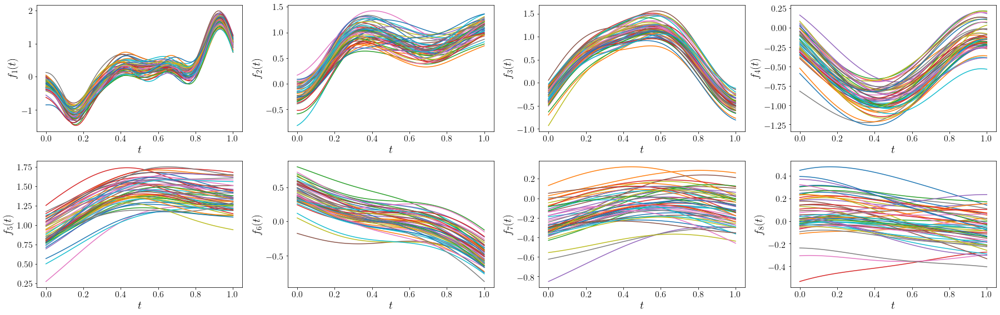

In [4]:
## plotting functional replicates ##
fig, axes = plt.subplots(2, 4, figsize=(25, 8))
idx = 1
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        axes[i,j].plot(t, F[idx-1])
        axes[i,j].set_xlabel('$t$', fontsize=20)
        axes[i,j].set_ylabel(''.join(('$f_{', str(idx), '}(t)$')), fontsize=20)
        axes[i,j].tick_params(axis='x', labelsize=16)
        axes[i,j].tick_params(axis='y', labelsize=16)
        idx += 1
plt.tight_layout()
plt.savefig(''.join(("figures/", toyName, "FunInput.pgf")), bbox_inches='tight') # save as PDF created with LaTeX        
plt.savefig(''.join(("figures/", toyName, "FunInput.pdf")), bbox_inches='tight') # save as PDF created with LaTeX

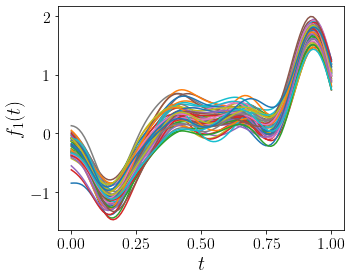

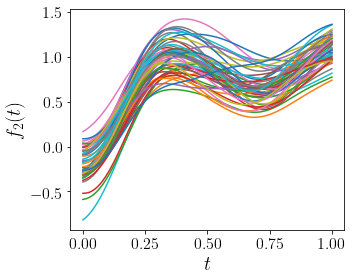

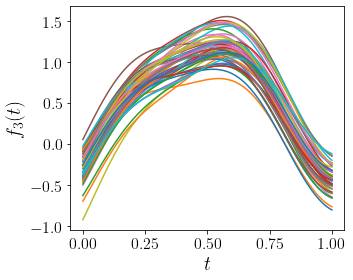

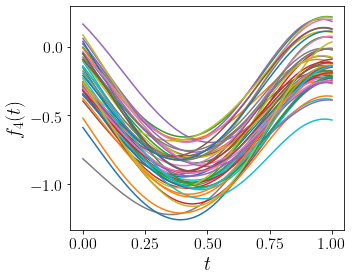

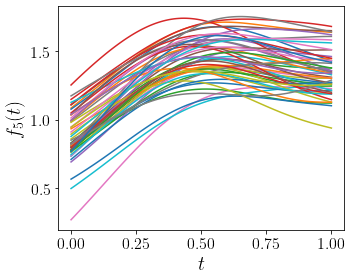

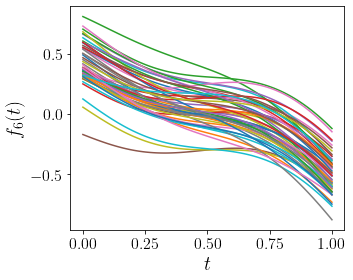

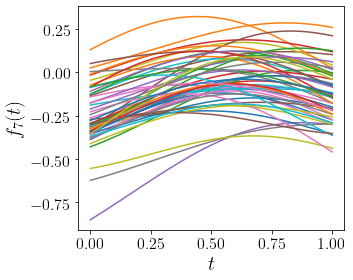

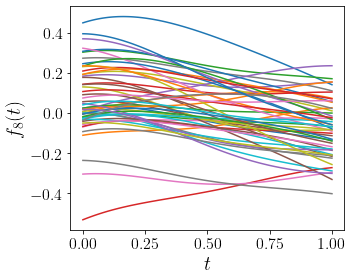

In [5]:
for idx in range(len(F)):
    fig, axes = plt.subplots(1, 1, figsize=(5, 4))
    axes.plot(t, F[idx])
    axes.set_xlabel('$t$', fontsize=20)
    axes.set_ylabel(''.join(('$f_{', str(idx+1), '}(t)$')), fontsize=20)
    axes.tick_params(axis='x', labelsize=16)
    axes.tick_params(axis='y', labelsize=16)
    plt.tight_layout()
    plt.savefig(''.join(("figures/", toyName, "FunInput", str(idx+1), ".pgf")), bbox_inches='tight') # save as PDF created with LaTeX        
    plt.savefig(''.join(("figures/", toyName, "FunInput", str(idx+1), ".pdf")), bbox_inches='tight') # save as PDF created with LaTeX

We now define the functional and spatial kernels and generate spatial GP replicates of the ouput:

In [6]:
#### building up the dataset ####
## functional kernel ##
f_list = fproj_list(F, nbterms=nt) # list with functional information (inputs, projection parameters)
U = list(range(nrep)) # integer sequence for indexing functional replicates
#lengthscale_f = np.repeat(1., nf) # lengthscale parameters for the functional kernel
np.random.seed(7)
lengthscale_f = np.round(np.random.uniform(0.2, 1, nf), 3) # lengthscale parameters for the functional kernel
kf = fMatern52(lengthscale=lengthscale_f, f_list=f_list)

## spatial kernel ##
# computing spatial data #
dim_x = 2 # spatial dimension
ngrid = 100 # nb spatial points per dimension
x = np.linspace(0, 1, ngrid) 
lengthscale_x = (0.1, 0.2)#np.repeat(.2, dim_x) # lengthscale parameters for the functional kernel
ks = [gpflow.kernels.Matern52(lengthscale=lengthscale_i) for lengthscale_i in lengthscale_x]

## computing the list with Cholesky arrays used for sampling ##
L = [np.linalg.cholesky(kf(U).numpy()),
     np.linalg.cholesky(ks[0](x.reshape([-1,1]))),
     np.linalg.cholesky(ks[1](x.reshape([-1,1])))]

## sampling from the spatio-functional kernel ##
np.random.seed(4)
maps = kron_mvrnorm(np.zeros(nrep * ngrid**2), L, 1, isChol=True)
maps = maps.T.reshape(nrep, ngrid, ngrid)

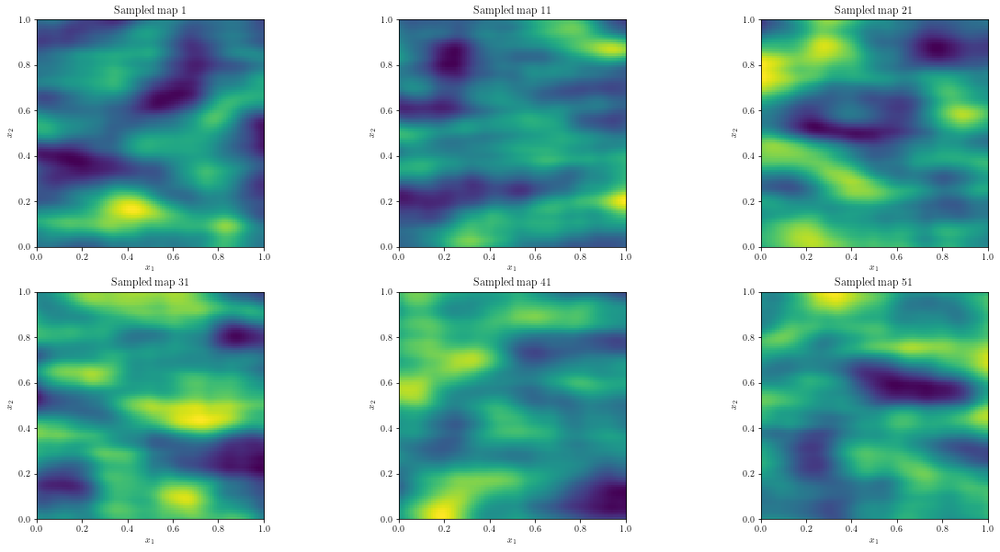

In [7]:
## plotting the nrep sampled spatial maps ##
fig, axes = plt.subplots(2, 3, figsize=(20,10))
maps_idx = np.linspace(0, 1, 6)*(nrep-1)
maps_idx = [np.int(mapi) for mapi in maps_idx]
idx = 1
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        axes[i,j].imshow(maps[maps_idx[idx-1],:,:], origin='lower', extent = (0,1,0,1))
        axes[i,j].set_title(' '.join(('Sampled map', str(maps_idx[idx-1]+1))))
        axes[i,j].set_xlabel('$x_1$')
        axes[i,j].set_ylabel('$x_2$')
        idx += 1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


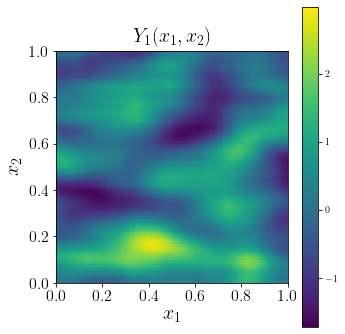

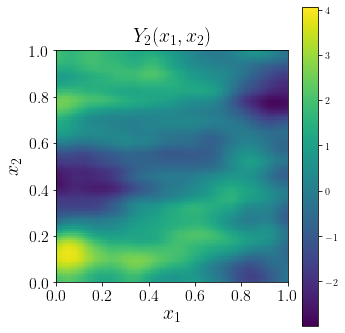

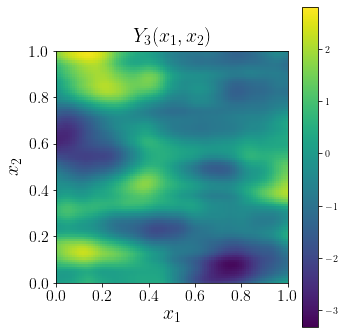

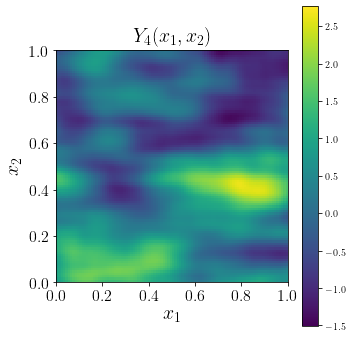

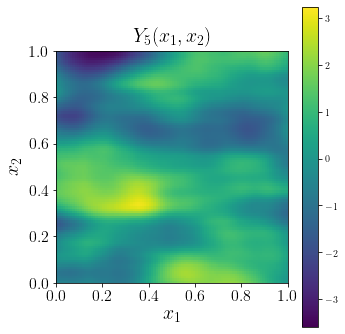

...

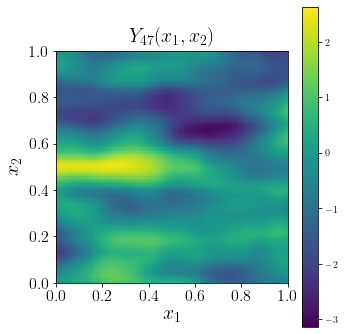

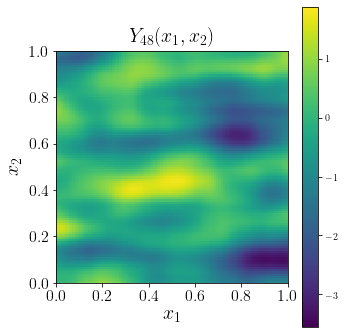

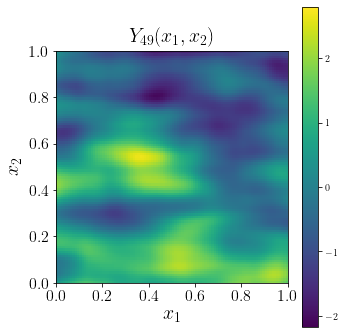

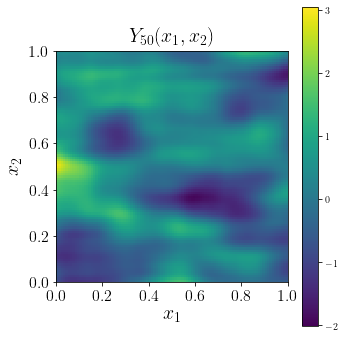

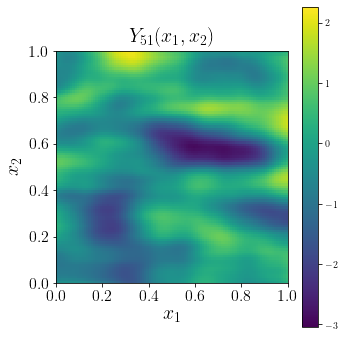

In [8]:
for idx in range(maps.shape[0]):
    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    im = axes.imshow(maps[idx, :, :], extent=[0,1,0,1], origin="lower")
    axes.set_title(''.join(('$Y_{', str(idx+1), '}(x_1,x_2)$')), size=20)
    axes.set_xlabel('$x_1$', fontsize=20)
    axes.set_ylabel('$x_2$', fontsize=20)
    axes.tick_params(axis='x', labelsize=16)
    axes.tick_params(axis='y', labelsize=16)
    axes.set_xticks(np.linspace(0,1,6))
    axes.set_yticks(np.linspace(0,1,6))
    fig.colorbar(im, ax=axes)
    clim = (1.05*np.min(maps[idx, :, :]), 1.05*np.max(maps[idx, :, :]))
    im.set_clim(clim)
    plt.tight_layout()
    #plt.savefig(''.join((toyName, "fkernels.pgf")), bbox_inches='tight') # save as PDF created with LaTeX        
    plt.savefig(''.join(("figures/", toyName, "Map", str(idx+1), ".pdf")), bbox_inches='tight')

Since we aim at testing the model for predicting maps where there is no spatial information, we will only use data from nrep-1 maps and let the remaining one for prediction purposes. 

In [9]:
#### spatial SVGPflow with functional inputs ####
## separating training and test maps ##
nrep_train = nrep-1
F_train = [Fi[:,:nrep_train] for Fi in F]
f_list_train = fproj_list(F_train) # list with functional information (inputs, projection parameters)

We now fix the design of points used in our experiments:

In [10]:
#ngrid_train = 10
#idxtrain = np.linspace(1, ngrid, ngrid_train) 
#xtrain = idxtrain/ngrid
#idxtrain = [np.int(idx_temp-1) for idx_temp in idxtrain]
#idxtrain2, idxtrain1 = np.meshgrid(idxtrain, idxtrain) # input spatial grid for training the model
#x2, x1 = np.meshgrid(xtrain, xtrain) # input spatial grid for training the model
#X_train = np.vstack((x1.flatten(), x2.flatten())).T
#Y_train = maps[:nrep_train,idxtrain1.flatten(),idxtrain2.flatten()].T
#nobs = X_train.shape[0] # nb of spatial observations

In [35]:
ntrain = 500
np.random.seed(4)
xlimits = np.array([[0.01, 0.99], [0.01, 0.99]])
sampling = LHS(xlimits=xlimits, criterion="ese")

np.random.seed(7)
X_train = sampling(ntrain)
#X_train = np.round(lhs(2, samples=ntrain, criterion='maximin'), 2)
idxtrain = np.round(X_train*100.)
idxtrain1, idxtrain2 = np.asarray([np.int(idx_temp-1) for idx_temp in idxtrain[:,0]]), np.asarray([np.int(idx_temp-1) for idx_temp in idxtrain[:,1]])
Y_train = maps[:nrep_train,idxtrain1.flatten(),idxtrain2.flatten()].T
nobs = X_train.shape[0] # nb of spatial observations

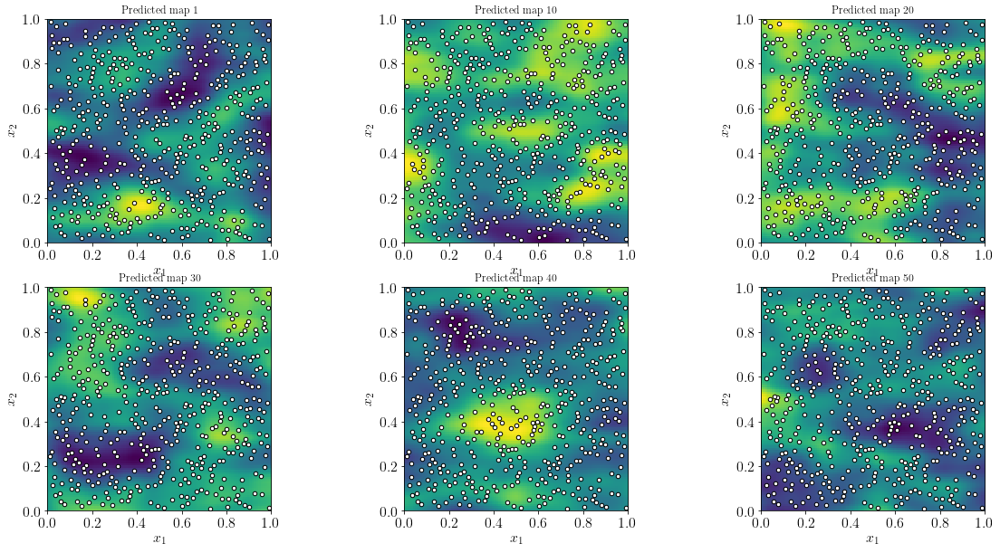

In [36]:
fig, axes = plt.subplots(2, 3, figsize=(20,10))
maps_idx = np.linspace(0, 1, 6)*(nrep_train-1)
maps_idx = [np.int(mapi) for mapi in maps_idx]
idx = 1
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        im = axes[i,j].imshow(maps[maps_idx[idx-1],:,:].reshape(ngrid,ngrid),
                              origin = "lower", extent = (0,1,0,1))
        axes[i,j].set_title(' '.join(('Predicted map', str(maps_idx[idx-1]+1))))
        axes[i,j].set_xlabel('$x_1$', fontsize=16)
        axes[i,j].set_ylabel('$x_2$', fontsize=16)
        axes[i,j].tick_params(axis='x', labelsize=16)
        axes[i,j].tick_params(axis='y', labelsize=16)
        axes[i,j].set_xticks(np.linspace(0,1,6))
        axes[i,j].scatter(X_train[:, 0], X_train[:, 1],
                          marker="o", color="w", edgecolors='k', s=20)
        idx += 1

## Classic multi-output SVGP model

We first define a classic MO SVGP with a linear coregionalization kernel:

In [37]:
#### LMC-SVGP regression model via GPflow ####
# multi-output spatial kernel from ks_list #
ks_base = gpflow.kernels.Matern52(variance =1., lengthscale=(0.5, 0.5))
ks_list = [ks_base for _ in range(nrep_train)]

# classic Linear Model of Coregionalization (LMC) #
ks = gpflow.kernels.LinearCoregionalization(ks_list, W=np.random.randn(nrep_train,nrep_train)) # PxL

# fixing the shared inducing variables (iv's) to training points #
#Z_iv = X_train.copy()
niv = 100
np.random.seed(7)
Z_iv = sampling(niv)
iv = gpflow.inducing_variables.SharedIndependentInducingVariables(gpflow.inducing_variables.InducingPoints(Z_iv))
M = Z_iv.shape[0]

# initializing the mean of variational posterior to be of shape MxL
q_mu = np.zeros((M, nrep_train)) 
# initializing the covariance of variational posterior to be of shape LxMxM
q_sqrt = np.repeat(np.eye(M)[None, ...], nrep_train, axis=0) * 1.0 

# creating the model #
likelihood = gpflow.likelihoods.Gaussian()
m = gpflow.models.SVGP(ks, likelihood, iv, q_mu=q_mu, q_sqrt=q_sqrt)
#set_trainable(m.inducing_variable, False)
print_summary(m)

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance SVGP.kernel.kernels[1].variance SVGP.kernel.kernels[2].variance SVGP.kernel.kernels[3].variance SVGP.kernel.kernels[4].variance SVGP.kernel.kernels[5].variance SVGP.kernel.kernels[6].variance SVGP.kernel.kernels[7].variance SVGP.kernel.kernels[8].variance SVGP.kernel.kernels[9].variance SVGP.kernel.kernels[10].variance SVGP.kernel.kernels[11].variance SVGP.kernel.kernels[12].variance SVGP.kernel.kernels[13].variance SVGP.kernel.kernels[14].variance SVGP.kernel.kernels[15].variance SVGP.kernel.kernels[16].variance SVGP.kernel.kernels[17].variance SVGP.kernel.kernels[18].variance SVGP.kernel.kernels[19].variance SVGP.kernel.kernels[20].variance SVGP.kernel.kernels[21].variance SVGP.kernel.kernels[22].variance SVGP.kernel.kernels[23].variance SVGP.kernel.kernels[24].variance SVGP.kernel.kernels[25].variance SVGP.kernel.kernels[26].variance SVGP.kernel.kernels[27].variance SVGP.kernel.kernels[28].variance SVGP.kernel.kernels[29].variance SVGP.kernel.kernels[30].variance SVGP.kernel.kernels[31].variance SVGP.kernel.kernels[32].variance SVGP.kernel.kernels[33].variance SVGP.kernel.kernels[34].variance SVGP.kernel.kernels[35].variance SVGP.kernel.kernels[36].variance SVGP.kernel.kernels[37].variance SVGP.kernel.kernels[38].variance SVGP.kernel.kernels[39].variance SVGP.kernel.kernels[40].variance SVGP.kernel.kernels[41].variance SVGP.kernel.kernels[42].variance SVGP.kernel.kernels[43].variance SVGP.kernel.kernels[44].variance SVGP.kernel.kernels[45].variance SVGP.kernel.kernels[46].variance SVGP.kernel.kernels[47].variance SVGP.kernel.kernels[48].variance SVGP.kernel.kernels[49].variance,Parameter,Softplus,,True,(),float64,1.0
SVGP.kernel.kernels[0].lengthscale SVGP.kernel.kernels[1].lengthscale SVGP.kernel.kernels[2].lengthscale SVGP.kernel.kernels[3].lengthscale SVGP.kernel.kernels[4].lengthscale SVGP.kernel.kernels[5].lengthscale SVGP.kernel.kernels[6].lengthscale SVGP.kernel.kernels[7].lengthscale SVGP.kernel.kernels[8].lengthscale SVGP.kernel.kernels[9].lengthscale SVGP.kernel.kernels[10].lengthscale SVGP.kernel.kernels[11].lengthscale SVGP.kernel.kernels[12].lengthscale SVGP.kernel.kernels[13].lengthscale SVGP.kernel.kernels[14].lengthscale SVGP.kernel.kernels[15].lengthscale SVGP.kernel.kernels[16].lengthscale SVGP.kernel.kernels[17].lengthscale SVGP.kernel.kernels[18].lengthscale SVGP.kernel.kernels[19].lengthscale SVGP.kernel.kernels[20].lengthscale SVGP.kernel.kernels[21].lengthscale SVGP.kernel.kernels[22].lengthscale SVGP.kernel.kernels[23].lengthscale SVGP.kernel.kernels[24].lengthscale SVGP.kernel.kernels[25].lengthscale SVGP.kernel.kernels[26].lengthscale SVGP.kernel.kernels[27].lengthscale SVGP.kernel.kernels[28].lengthscale SVGP.kernel.kernels[29].lengthscale SVGP.kernel.kernels[30].lengthscale SVGP.kernel.kernels[31].lengthscale SVGP.kernel.kernels[32].lengthscale SVGP.kernel.kernels[33].lengthscale SVGP.kernel.kernels[34].lengthscale SVGP.kernel.kernels[35].lengthscale SVGP.kernel.kernels[36].lengthscale SVGP.kernel.kernels[37].lengthscale SVGP.kernel.kernels[38].lengthscale SVGP.kernel.kernels[39].lengthscale SVGP.kernel.kernels[40].lengthscale SVGP.kernel.kernels[41].lengthscale SVGP.kernel.kernels[42].lengthscale SVGP.kernel.kernels[43].lengthscale SVGP.kernel.kernels[44].lengthscale SVGP.kernel.kernels[45].lengthscale SVGP.kernel.kernels[46].lengthscale SVGP.kernel.kernels[47].lengthscale SVGP.kernel.kernels[48].lengthscale SVGP.kernel.kernels[49].lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.5 0.5]
SVGP.kernel.W,Parameter,,,True,"(50, 50)",float64,"[[-1.28272194, 0.92192682, -1.6302399..."
SVGP.likelihood.variance,Parameter,Softplus + AffineScalar,,True,(),float64,1.0
SVGP.inducing_variable.inducing_variable_shared.Z,Parameter,,,True,"(100, 2)",float64,"[[0.09840819, 0.97847737..."
SVGP.q_mu,Parameter,,,True,"(100, 50)",float64,"[[0., 0., 0...."
SVGP.q_sqrt,Parameter,FillTriangular,,True,"(50, 100, 100)",float64,"[[

We now define the optimiser and the cost function to be maximised:

In [38]:
## optimizing the fLMC-SVGP model using minibatches ##
minibatch_size = 100
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train)) \
    .repeat() \
    .shuffle(nobs)

In [39]:
@tf.function(autograph=False)
def optimization_step(optimizer, model: gpflow.models.SVGP, batch):
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(model.trainable_variables)
        objective = - model.elbo(batch)
        grads = tape.gradient(objective, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return objective

def run_adam(model, iterations):
    """
    Utility function running the Adam optimizer
    
    :param model: GPflow model
    :param interations: number of iterations
    """
    # Create an Adam Optimizer action
    logf = []
    times = []
    train_it = iter(train_dataset.batch(minibatch_size))
    adam = tf.optimizers.Adam()
    start_time = time.time()
    for step in range(iterations):
        elbo = - optimization_step(adam, model, next(train_it))
        if step % 10 == 0:
            times.append(time.time() - start_time)            
            logf.append(elbo.numpy())
        if step % 1000 == 0:
            print("Iteration: ", step)
    return logf, times

In [40]:
#gpflow.default_jitter = 1e-6
maxiter = ci_niter(7000)
logf, times = run_adam(m, maxiter)
print("Lapse time for training: ", np.float16(times[len(times)-1]))

Iteration:  0
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Lapse time for training:  5044.0


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance SVGP.kernel.kernels[1].variance SVGP.kernel.kernels[2].variance SVGP.kernel.kernels[3].variance SVGP.kernel.kernels[4].variance SVGP.kernel.kernels[5].variance SVGP.kernel.kernels[6].variance SVGP.kernel.kernels[7].variance SVGP.kernel.kernels[8].variance SVGP.kernel.kernels[9].variance SVGP.kernel.kernels[10].variance SVGP.kernel.kernels[11].variance SVGP.kernel.kernels[12].variance SVGP.kernel.kernels[13].variance SVGP.kernel.kernels[14].variance SVGP.kernel.kernels[15].variance SVGP.kernel.kernels[16].variance SVGP.kernel.kernels[17].variance SVGP.kernel.kernels[18].variance SVGP.kernel.kernels[19].variance SVGP.kernel.kernels[20].variance SVGP.kernel.kernels[21].variance SVGP.kernel.kernels[22].variance SVGP.kernel.kernels[23].variance SVGP.kernel.kernels[24].variance SVGP.kernel.kernels[25].variance SVGP.kernel.kernels[26].variance SVGP.kernel.kernels[27].variance SVGP.kernel.kernels[28].variance SVGP.kernel.kernels[29].variance SVGP.kernel.kernels[30].variance SVGP.kernel.kernels[31].variance SVGP.kernel.kernels[32].variance SVGP.kernel.kernels[33].variance SVGP.kernel.kernels[34].variance SVGP.kernel.kernels[35].variance SVGP.kernel.kernels[36].variance SVGP.kernel.kernels[37].variance SVGP.kernel.kernels[38].variance SVGP.kernel.kernels[39].variance SVGP.kernel.kernels[40].variance SVGP.kernel.kernels[41].variance SVGP.kernel.kernels[42].variance SVGP.kernel.kernels[43].variance SVGP.kernel.kernels[44].variance SVGP.kernel.kernels[45].variance SVGP.kernel.kernels[46].variance SVGP.kernel.kernels[47].variance SVGP.kernel.kernels[48].variance SVGP.kernel.kernels[49].variance,Parameter,Softplus,,True,(),float64,0.6520300613966611
SVGP.kernel.kernels[0].lengthscale SVGP.kernel.kernels[1].lengthscale SVGP.kernel.kernels[2].lengthscale SVGP.kernel.kernels[3].lengthscale SVGP.kernel.kernels[4].lengthscale SVGP.kernel.kernels[5].lengthscale SVGP.kernel.kernels[6].lengthscale SVGP.kernel.kernels[7].lengthscale SVGP.kernel.kernels[8].lengthscale SVGP.kernel.kernels[9].lengthscale SVGP.kernel.kernels[10].lengthscale SVGP.kernel.kernels[11].lengthscale SVGP.kernel.kernels[12].lengthscale SVGP.kernel.kernels[13].lengthscale SVGP.kernel.kernels[14].lengthscale SVGP.kernel.kernels[15].lengthscale SVGP.kernel.kernels[16].lengthscale SVGP.kernel.kernels[17].lengthscale SVGP.kernel.kernels[18].lengthscale SVGP.kernel.kernels[19].lengthscale SVGP.kernel.kernels[20].lengthscale SVGP.kernel.kernels[21].lengthscale SVGP.kernel.kernels[22].lengthscale SVGP.kernel.kernels[23].lengthscale SVGP.kernel.kernels[24].lengthscale SVGP.kernel.kernels[25].lengthscale SVGP.kernel.kernels[26].lengthscale SVGP.kernel.kernels[27].lengthscale SVGP.kernel.kernels[28].lengthscale SVGP.kernel.kernels[29].lengthscale SVGP.kernel.kernels[30].lengthscale SVGP.kernel.kernels[31].lengthscale SVGP.kernel.kernels[32].lengthscale SVGP.kernel.kernels[33].lengthscale SVGP.kernel.kernels[34].lengthscale SVGP.kernel.kernels[35].lengthscale SVGP.kernel.kernels[36].lengthscale SVGP.kernel.kernels[37].lengthscale SVGP.kernel.kernels[38].lengthscale SVGP.kernel.kernels[39].lengthscale SVGP.kernel.kernels[40].lengthscale SVGP.kernel.kernels[41].lengthscale SVGP.kernel.kernels[42].lengthscale SVGP.kernel.kernels[43].lengthscale SVGP.kernel.kernels[44].lengthscale SVGP.kernel.kernels[45].lengthscale SVGP.kernel.kernels[46].lengthscale SVGP.kernel.kernels[47].lengthscale SVGP.kernel.kernels[48].lengthscale SVGP.kernel.kernels[49].lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.45237934 0.89470911]
SVGP.kernel.W,Parameter,,,True,"(50, 50)",float64,"[[-0.1721728, 0.23139603, -0.89152973..."
SVGP.likelihood.variance,Parameter,Softplus + AffineScalar,,True,(),float64,0.2931395350683131
SVGP.inducing_variable.inducing_variable_shared.Z,Parameter,,,True,"(100, 2)",float64,"[[-0.04256976, 1.05573787..."
SVGP.q_mu,Parameter,,,True,"(100, 50)",float64,"[[-0.30118547, 0.01573372, -0.17589409..."


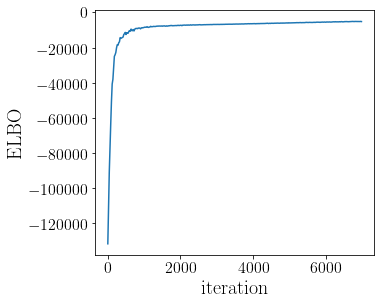

In [62]:
## printing summary optimized model ##
print_summary(m)
fig, axes = plt.subplots(1, 1, figsize=(5,4.5))
idx = 0
axes.plot(np.arange(maxiter)[::20], logf[::2])
axes.set_xlabel('iteration', size =20)
axes.set_ylabel('ELBO', size =20)
axes.tick_params(axis='x', labelsize=16)
axes.tick_params(axis='y', labelsize=16)
plt.savefig(''.join(("figures/", toyName, "ELBO.pgf")), bbox_inches='tight')
plt.savefig(''.join(("figures/", toyName, "ELBO.pdf")), bbox_inches='tight')

We now test the model to predict the entire nrep-1 maps: 

In [42]:
#### sLMC-SVGP predictions at new spatial points over the same training maps ####
ngrid_test = ngrid # nb spatial test points per dimension
x2_test, x1_test = np.meshgrid(x, x) # input spatial grid for testing the model
X_test = np.vstack((x1_test.flatten(), x2_test.flatten())).T 

## predictive results ##
start_time = time.time()
mu, var = m.predict_f(X_test)
lapse_time =  time.time() - start_time
print("Lapse time for prediction: ", np.float16(lapse_time))

Lapse time for prediction:  8.32


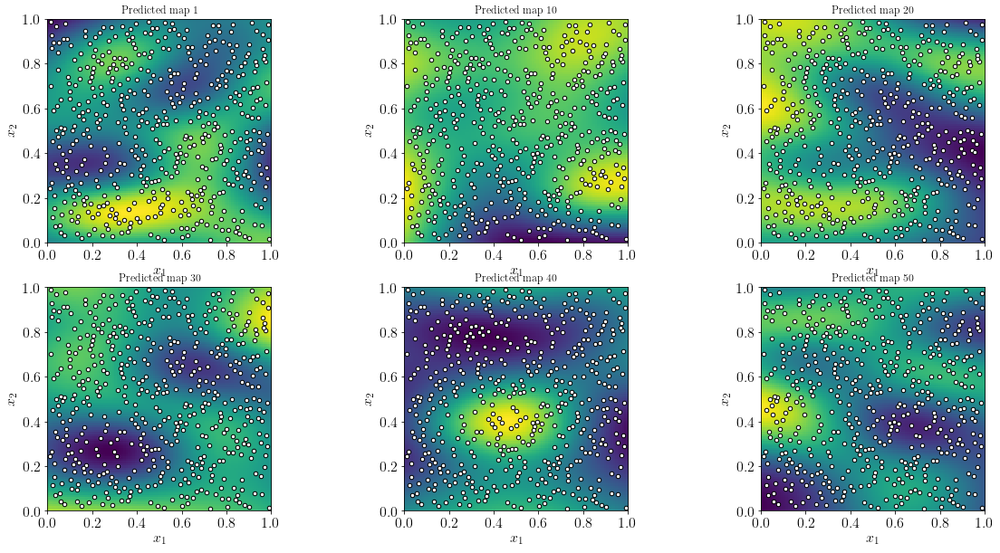

In [43]:
## plotting the nrep sampled spatial maps ##
pred = mu.numpy()#.reshape(ngrid_test,ngrid_test, nrep) # predictive mean
fig, axes = plt.subplots(2, 3, figsize=(20,10))
maps_idx = np.linspace(0, 1, 6)*(nrep_train-1)
maps_idx = [np.int(mapi) for mapi in maps_idx]
idx = 1
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        im = axes[i,j].imshow(pred[:,maps_idx[idx-1]].reshape(ngrid_test,ngrid_test),
                              origin = "lower", extent = (0,1,0,1))
        axes[i,j].set_title(' '.join(('Predicted map', str(maps_idx[idx-1]+1))))
        axes[i,j].set_xlabel('$x_1$', fontsize=16)
        axes[i,j].set_ylabel('$x_2$', fontsize=16)
        axes[i,j].tick_params(axis='x', labelsize=16)
        axes[i,j].tick_params(axis='y', labelsize=16)
        axes[i,j].set_xticks(np.linspace(0,1,6))
        axes[i,j].scatter(X_train[:, 0], X_train[:, 1],
                          marker="o", color="w", edgecolors='k', s=20)
        idx += 1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


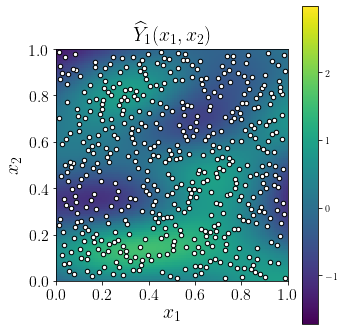

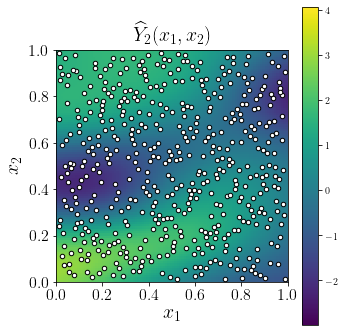

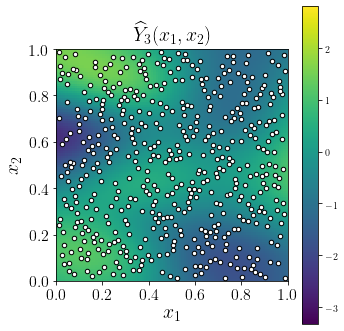

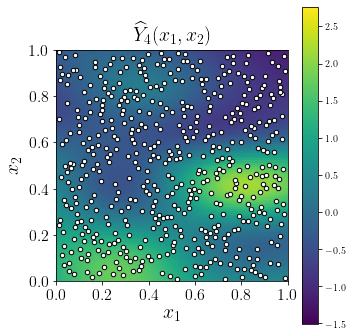

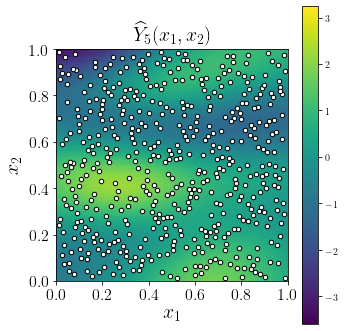

...

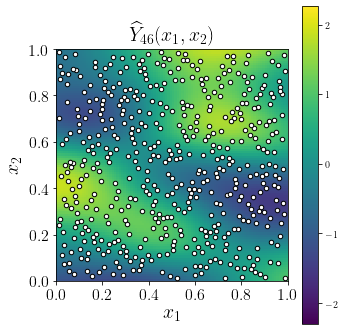

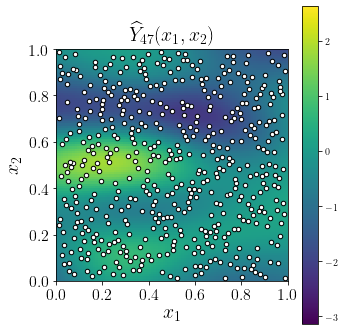

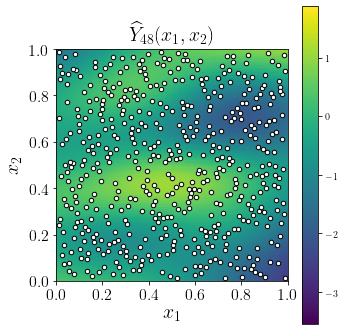

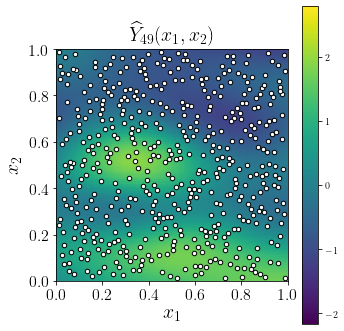

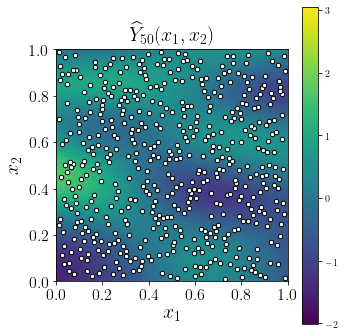

In [44]:
for idx in range(nrep_train):
    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    im = axes.imshow(pred[:,idx].reshape(ngrid_test,ngrid_test),
                        extent=[0,1,0,1], origin="lower")
    axes.set_title(''.join(('$\widehat{Y}_{', str(idx+1), '}(x_1,x_2)$')), size=20)
    axes.set_xlabel('$x_1$', fontsize=20)
    axes.set_ylabel('$x_2$', fontsize=20)
    axes.tick_params(axis='x', labelsize=16)
    axes.tick_params(axis='y', labelsize=16)
    axes.set_xticks(np.linspace(0,1,6))
    axes.set_yticks(np.linspace(0,1,6))
    fig.colorbar(im, ax=axes)
    axes.scatter(X_train[:, 0], X_train[:, 1],
                 marker="o", color="w", edgecolors='k', s=20)
    clim = (1.05*np.min(maps[idx, :, :]), 1.05*np.max(maps[idx, :, :]))
    im.set_clim(clim)
    plt.tight_layout()
    #plt.savefig(''.join((toyName, "fkernels.pgf")), bbox_inches='tight') # save as PDF created with LaTeX        
    plt.savefig(''.join(("figures/", toyName, "MapPred", str(idx+1), ".pdf")), bbox_inches='tight')

0.7869133177979696

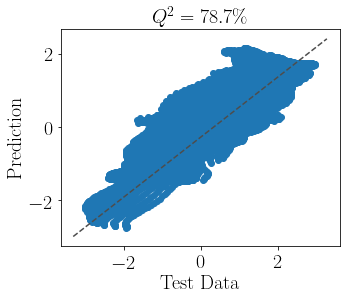

In [59]:
y_test = maps[:nrep_train,:,:].reshape(nrep_train,ngrid**2).T.reshape(-1,1)
y_pred = pred.reshape(-1,1)
q2 =  1. - np.sum((y_test - y_pred)**2)/np.sum((y_test - np.mean(y_test))**2)

fig, axes = plt.subplots(1, 1, figsize=(5,4))
axes.plot(y_test[::10], y_pred[::10], "o")
axes.plot(axes.get_xlim(), axes.get_ylim(), ls="--", c=".3");
axes.set_title(''.join((r"$Q^2=", str(np.round(q2*100., 1)), " \%$")), size=20)
axes.set_xlabel('Test Data', size=20); axes.set_ylabel('Prediction', size=20);
axes.tick_params(axis='x', labelsize=20)
axes.tick_params(axis='y', labelsize=20)
#plt.savefig(''.join(("figures/", toyName, "MapvsPred.pgf")), bbox_inches='tight')
plt.savefig(''.join(("figures/", toyName, "MapvsPred.pdf")), bbox_inches='tight')

q2

## Multi-output SVGP model with functional coregionalization kernel

We now define an MO SVGP with a functional linear coregionalization kernel:

In [46]:
#### fLMC-SVGP regression model via GPflow ####
# multi-output kernel from ks_list #
ks_base = gpflow.kernels.Matern52(variance =1., lengthscale=(0.5, 0.5))
ks_list = [ks_base for _ in range(nrep_train)]

# functional Linear Model of Coregionalization (fLMC) #
# precomputing the distances between functional training replicates for faster implementations
distances_f = [dist2ff(coef_i, coef_j, f_list_train[2])
               for coef_i in f_list_train[1] for coef_j in f_list_train[1]]
ksf = fLinearCoregionalization(ks_list, lengthscale_f=np.repeat(0.5, nf),
                               f_list = f_list_train, distances=distances_f)
#ks = gpflow.kernels.LinearCoregionalization(ks_list, W=np.random.randn(nrep_train,nf))

# initializing the mean of variational posterior to be of shape MxL
qf_mu = np.zeros((M, nrep_train)) 
# initializing the covariance of variational posterior to be of shape LxMxM
qf_sqrt = np.repeat(np.eye(M)[None, ...], nrep_train, axis=0) * 1.0 

# creating the model #
likelihood = gpflow.likelihoods.Gaussian()
mf = gpflow.models.SVGP(ksf, likelihood, iv, q_mu=qf_mu, q_sqrt=qf_sqrt)
#set_trainable(mf.inducing_variable, False)
print_summary(mf)

name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance SVGP.kernel.kernels[1].variance SVGP.kernel.kernels[2].variance SVGP.kernel.kernels[3].variance SVGP.kernel.kernels[4].variance SVGP.kernel.kernels[5].variance SVGP.kernel.kernels[6].variance SVGP.kernel.kernels[7].variance SVGP.kernel.kernels[8].variance SVGP.kernel.kernels[9].variance SVGP.kernel.kernels[10].variance SVGP.kernel.kernels[11].variance SVGP.kernel.kernels[12].variance SVGP.kernel.kernels[13].variance SVGP.kernel.kernels[14].variance SVGP.kernel.kernels[15].variance SVGP.kernel.kernels[16].variance SVGP.kernel.kernels[17].variance SVGP.kernel.kernels[18].variance SVGP.kernel.kernels[19].variance SVGP.kernel.kernels[20].variance SVGP.kernel.kernels[21].variance SVGP.kernel.kernels[22].variance SVGP.kernel.kernels[23].variance SVGP.kernel.kernels[24].variance SVGP.kernel.kernels[25].variance SVGP.kernel.kernels[26].variance SVGP.kernel.kernels[27].variance SVGP.kernel.kernels[28].variance SVGP.kernel.kernels[29].variance SVGP.kernel.kernels[30].variance SVGP.kernel.kernels[31].variance SVGP.kernel.kernels[32].variance SVGP.kernel.kernels[33].variance SVGP.kernel.kernels[34].variance SVGP.kernel.kernels[35].variance SVGP.kernel.kernels[36].variance SVGP.kernel.kernels[37].variance SVGP.kernel.kernels[38].variance SVGP.kernel.kernels[39].variance SVGP.kernel.kernels[40].variance SVGP.kernel.kernels[41].variance SVGP.kernel.kernels[42].variance SVGP.kernel.kernels[43].variance SVGP.kernel.kernels[44].variance SVGP.kernel.kernels[45].variance SVGP.kernel.kernels[46].variance SVGP.kernel.kernels[47].variance SVGP.kernel.kernels[48].variance SVGP.kernel.kernels[49].variance,Parameter,Softplus,,True,(),float64,1.0
SVGP.kernel.kernels[0].lengthscale SVGP.kernel.kernels[1].lengthscale SVGP.kernel.kernels[2].lengthscale SVGP.kernel.kernels[3].lengthscale SVGP.kernel.kernels[4].lengthscale SVGP.kernel.kernels[5].lengthscale SVGP.kernel.kernels[6].lengthscale SVGP.kernel.kernels[7].lengthscale SVGP.kernel.kernels[8].lengthscale SVGP.kernel.kernels[9].lengthscale SVGP.kernel.kernels[10].lengthscale SVGP.kernel.kernels[11].lengthscale SVGP.kernel.kernels[12].lengthscale SVGP.kernel.kernels[13].lengthscale SVGP.kernel.kernels[14].lengthscale SVGP.kernel.kernels[15].lengthscale SVGP.kernel.kernels[16].lengthscale SVGP.kernel.kernels[17].lengthscale SVGP.kernel.kernels[18].lengthscale SVGP.kernel.kernels[19].lengthscale SVGP.kernel.kernels[20].lengthscale SVGP.kernel.kernels[21].lengthscale SVGP.kernel.kernels[22].lengthscale SVGP.kernel.kernels[23].lengthscale SVGP.kernel.kernels[24].lengthscale SVGP.kernel.kernels[25].lengthscale SVGP.kernel.kernels[26].lengthscale SVGP.kernel.kernels[27].lengthscale SVGP.kernel.kernels[28].lengthscale SVGP.kernel.kernels[29].lengthscale SVGP.kernel.kernels[30].lengthscale SVGP.kernel.kernels[31].lengthscale SVGP.kernel.kernels[32].lengthscale SVGP.kernel.kernels[33].lengthscale SVGP.kernel.kernels[34].lengthscale SVGP.kernel.kernels[35].lengthscale SVGP.kernel.kernels[36].lengthscale SVGP.kernel.kernels[37].lengthscale SVGP.kernel.kernels[38].lengthscale SVGP.kernel.kernels[39].lengthscale SVGP.kernel.kernels[40].lengthscale SVGP.kernel.kernels[41].lengthscale SVGP.kernel.kernels[42].lengthscale SVGP.kernel.kernels[43].lengthscale SVGP.kernel.kernels[44].lengthscale SVGP.kernel.kernels[45].lengthscale SVGP.kernel.kernels[46].lengthscale SVGP.kernel.kernels[47].lengthscale SVGP.kernel.kernels[48].lengthscale SVGP.kernel.kernels[49].lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.5 0.5]
SVGP.kernel.lengthscale_f,Parameter,Softplus,,True,"(8,)",float64,"[0.5, 0.5, 0.5..."
SVGP.likelihood.variance,Parameter,Softplus + AffineScalar,,True,(),float64,1.0
SVGP.inducing_variable.inducing_variable_shared.Z,Parameter,,,True,"(100, 2)",float64,"[[-0.38694504, 1.36884125..."
SVGP.q_mu,Parameter,,,True,"(100, 50)",float64,"[[0., 0., 0...."
SVGP.q_sqrt,Parameter,FillTriangular,,True,"(50, 100, 100)",float64,"[[[1., 0

In [47]:
@tf.function(autograph=False)
def optimization_step(optimizer, model: gpflow.models.SVGP, batch):
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(model.trainable_variables)
        objective = - model.elbo(batch)
        grads = tape.gradient(objective, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return objective

def run_adam(model, iterations):
    """
    Utility function running the Adam optimizer
    
    :param model: GPflow model
    :param interations: number of iterations
    """
    # Create an Adam Optimizer action
    logf = []
    times = []
    train_it = iter(train_dataset.batch(minibatch_size))
    adam = tf.optimizers.Adam()
    start_time = time.time()
    for step in range(iterations):
        elbo = - optimization_step(adam, model, next(train_it))
        if step % 10 == 0:
            times.append(time.time() - start_time)            
            logf.append(elbo.numpy())
        if step % 1000 == 0:
            print("Iteration: ", step)
    return logf, times

In [48]:
#gpflow.default_jitter = 1e-6
maxiter = ci_niter(7000)
logff, timesf = run_adam(mf, maxiter)
print("Lapse time for training: ", np.float16(timesf[len(timesf)-1]))

Iteration:  0
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Lapse time for training:  8640.0


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance SVGP.kernel.kernels[1].variance SVGP.kernel.kernels[2].variance SVGP.kernel.kernels[3].variance SVGP.kernel.kernels[4].variance SVGP.kernel.kernels[5].variance SVGP.kernel.kernels[6].variance SVGP.kernel.kernels[7].variance SVGP.kernel.kernels[8].variance SVGP.kernel.kernels[9].variance SVGP.kernel.kernels[10].variance SVGP.kernel.kernels[11].variance SVGP.kernel.kernels[12].variance SVGP.kernel.kernels[13].variance SVGP.kernel.kernels[14].variance SVGP.kernel.kernels[15].variance SVGP.kernel.kernels[16].variance SVGP.kernel.kernels[17].variance SVGP.kernel.kernels[18].variance SVGP.kernel.kernels[19].variance SVGP.kernel.kernels[20].variance SVGP.kernel.kernels[21].variance SVGP.kernel.kernels[22].variance SVGP.kernel.kernels[23].variance SVGP.kernel.kernels[24].variance SVGP.kernel.kernels[25].variance SVGP.kernel.kernels[26].variance SVGP.kernel.kernels[27].variance SVGP.kernel.kernels[28].variance SVGP.kernel.kernels[29].variance SVGP.kernel.kernels[30].variance SVGP.kernel.kernels[31].variance SVGP.kernel.kernels[32].variance SVGP.kernel.kernels[33].variance SVGP.kernel.kernels[34].variance SVGP.kernel.kernels[35].variance SVGP.kernel.kernels[36].variance SVGP.kernel.kernels[37].variance SVGP.kernel.kernels[38].variance SVGP.kernel.kernels[39].variance SVGP.kernel.kernels[40].variance SVGP.kernel.kernels[41].variance SVGP.kernel.kernels[42].variance SVGP.kernel.kernels[43].variance SVGP.kernel.kernels[44].variance SVGP.kernel.kernels[45].variance SVGP.kernel.kernels[46].variance SVGP.kernel.kernels[47].variance SVGP.kernel.kernels[48].variance SVGP.kernel.kernels[49].variance,Parameter,Softplus,,True,(),float64,1.0991946477201122
SVGP.kernel.kernels[0].lengthscale SVGP.kernel.kernels[1].lengthscale SVGP.kernel.kernels[2].lengthscale SVGP.kernel.kernels[3].lengthscale SVGP.kernel.kernels[4].lengthscale SVGP.kernel.kernels[5].lengthscale SVGP.kernel.kernels[6].lengthscale SVGP.kernel.kernels[7].lengthscale SVGP.kernel.kernels[8].lengthscale SVGP.kernel.kernels[9].lengthscale SVGP.kernel.kernels[10].lengthscale SVGP.kernel.kernels[11].lengthscale SVGP.kernel.kernels[12].lengthscale SVGP.kernel.kernels[13].lengthscale SVGP.kernel.kernels[14].lengthscale SVGP.kernel.kernels[15].lengthscale SVGP.kernel.kernels[16].lengthscale SVGP.kernel.kernels[17].lengthscale SVGP.kernel.kernels[18].lengthscale SVGP.kernel.kernels[19].lengthscale SVGP.kernel.kernels[20].lengthscale SVGP.kernel.kernels[21].lengthscale SVGP.kernel.kernels[22].lengthscale SVGP.kernel.kernels[23].lengthscale SVGP.kernel.kernels[24].lengthscale SVGP.kernel.kernels[25].lengthscale SVGP.kernel.kernels[26].lengthscale SVGP.kernel.kernels[27].lengthscale SVGP.kernel.kernels[28].lengthscale SVGP.kernel.kernels[29].lengthscale SVGP.kernel.kernels[30].lengthscale SVGP.kernel.kernels[31].lengthscale SVGP.kernel.kernels[32].lengthscale SVGP.kernel.kernels[33].lengthscale SVGP.kernel.kernels[34].lengthscale SVGP.kernel.kernels[35].lengthscale SVGP.kernel.kernels[36].lengthscale SVGP.kernel.kernels[37].lengthscale SVGP.kernel.kernels[38].lengthscale SVGP.kernel.kernels[39].lengthscale SVGP.kernel.kernels[40].lengthscale SVGP.kernel.kernels[41].lengthscale SVGP.kernel.kernels[42].lengthscale SVGP.kernel.kernels[43].lengthscale SVGP.kernel.kernels[44].lengthscale SVGP.kernel.kernels[45].lengthscale SVGP.kernel.kernels[46].lengthscale SVGP.kernel.kernels[47].lengthscale SVGP.kernel.kernels[48].lengthscale SVGP.kernel.kernels[49].lengthscale,Parameter,Softplus,,True,"(2,)",float64,[0.14477804 0.31093913]
SVGP.kernel.lengthscale_f,Parameter,Softplus,,True,"(8,)",float64,"[0.48062118, 1.24387126, 0.27943317..."
SVGP.likelihood.variance,Parameter,Softplus + AffineScalar,,True,(),float64,0.15101518901886424
SVGP.inducing_variable.inducing_variable_shared.Z,Parameter,,,True,"(100, 2)",float64,"[[-0.04256976, 1.05573787..."
SVGP.q_mu,Parameter,,,True,"(100, 50)",float64,"[[0.11894597, -0.46796327, -

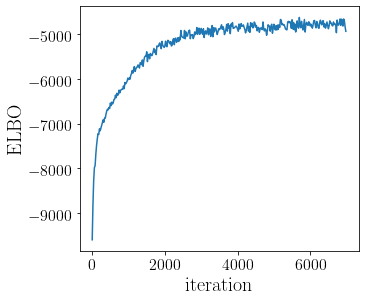

In [61]:
print_summary(mf)

## printing summary optimized model ##
fig, axes = plt.subplots(1, 1, figsize=(5,4.5))
idx = 0
axes.plot(np.arange(maxiter)[::20], logff[::2])
axes.set_xlabel('iteration', size =20)
axes.set_ylabel('ELBO', size =20)
axes.tick_params(axis='x', labelsize=16)
axes.tick_params(axis='y', labelsize=16)
plt.savefig(''.join(("figures/", toyName, "ELBOf.pgf")), bbox_inches='tight')
plt.savefig(''.join(("figures/", toyName, "ELBOf.pdf")), bbox_inches='tight')

In [50]:
## predictive results ##
start_time = time.time()
muf, varf = mf.predict_f(X_test)
lapse_time =  time.time() - start_time
print("Lapse time for prediction: ", np.float16(lapse_time))

Lapse time for prediction:  14.72


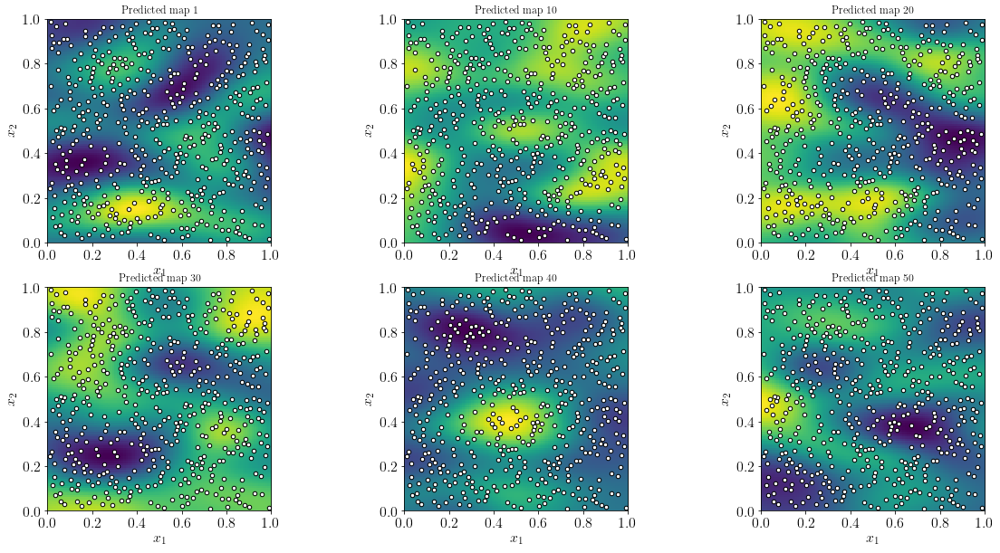

In [51]:
## plotting the nrep sampled spatial maps ##
predf = muf.numpy()#.reshape(ngrid_test,ngrid_test, nrep) # predictive mean
fig, axes = plt.subplots(2, 3, figsize=(20,10))
maps_idx = np.linspace(0, 1, 6)*(nrep_train-1)
maps_idx = [np.int(mapi) for mapi in maps_idx]
idx = 1
for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        im = axes[i,j].imshow(predf[:,maps_idx[idx-1]].reshape(ngrid_test,ngrid_test),
                              origin = "lower", extent = (0,1,0,1))
        axes[i,j].set_title(' '.join(('Predicted map', str(maps_idx[idx-1]+1))))
        axes[i,j].set_xlabel('$x_1$', fontsize=16)
        axes[i,j].set_ylabel('$x_2$', fontsize=16)
        axes[i,j].tick_params(axis='x', labelsize=16)
        axes[i,j].tick_params(axis='y', labelsize=16)
        axes[i,j].set_xticks(np.linspace(0,1,6))
        axes[i,j].scatter(X_train[:, 0], X_train[:, 1],
                          marker="o", color="w", edgecolors='k', s=20)
        idx += 1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


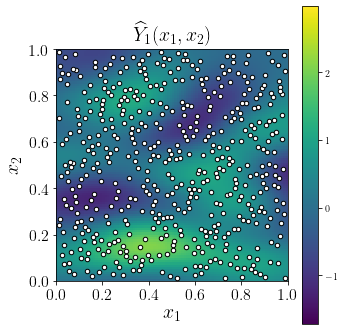

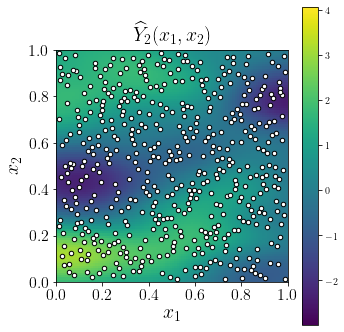

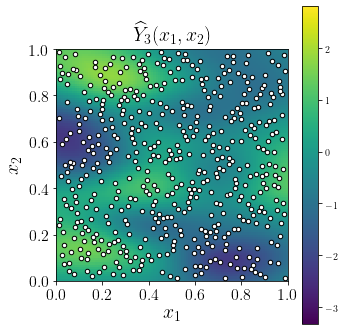

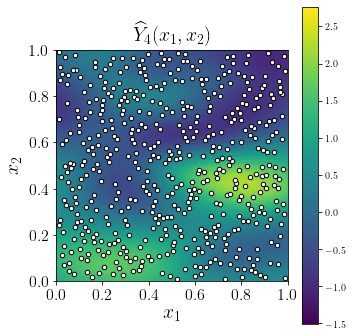

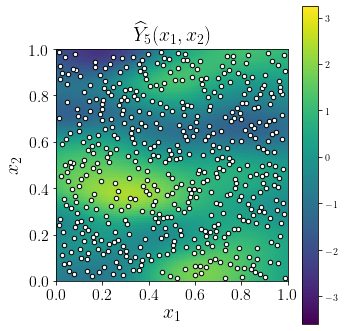

...

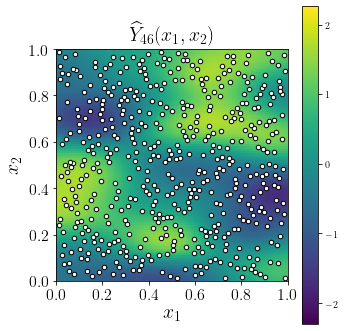

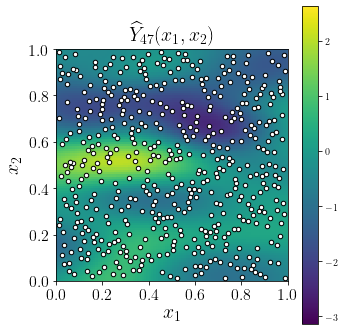

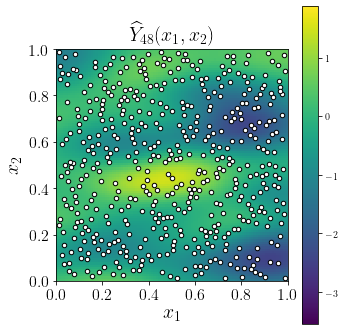

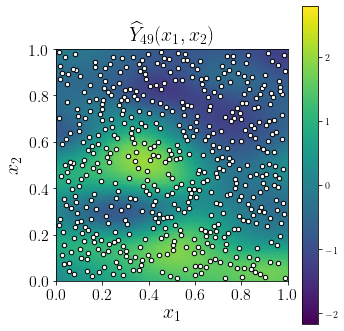

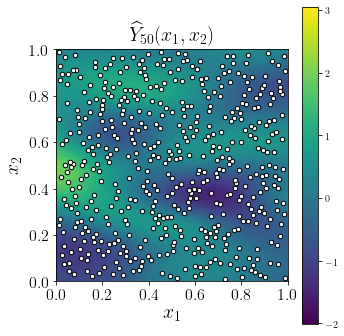

In [52]:
for idx in range(nrep_train):
    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    im = axes.imshow(predf[:,idx].reshape(ngrid_test,ngrid_test),
                        extent=[0,1,0,1], origin="lower")
    axes.set_title(''.join(('$\widehat{Y}_{', str(idx+1), '}(x_1,x_2)$')), size=20)
    axes.set_xlabel('$x_1$', fontsize=20)
    axes.set_ylabel('$x_2$', fontsize=20)
    axes.tick_params(axis='x', labelsize=16)
    axes.tick_params(axis='y', labelsize=16)
    axes.set_xticks(np.linspace(0,1,6))
    axes.set_yticks(np.linspace(0,1,6))
    fig.colorbar(im, ax=axes)
    axes.scatter(X_train[:, 0], X_train[:, 1],
                 marker="o", color="w", edgecolors='k', s=20)
    clim = (1.05*np.min(maps[idx, :, :]), 1.05*np.max(maps[idx, :, :]))
    im.set_clim(clim)
    plt.tight_layout()
    plt.savefig(''.join(("figures/", toyName, "MapPredf", str(idx+1), ".pdf")), bbox_inches='tight')

0.9034958318032619

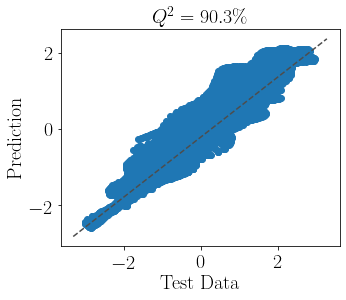

In [60]:
y_test = maps[:nrep_train,:,:].reshape(nrep_train,ngrid**2).T.reshape(-1,1)
y_predf = predf.reshape(-1,1)
q2f =  1. - np.sum((y_test - y_predf)**2)/np.sum((y_test - np.mean(y_test))**2)

fig, axes = plt.subplots(1, 1, figsize=(5,4))
axes.plot(y_test[::10], y_predf[::10], "o")
axes.plot(axes.get_xlim(), axes.get_ylim(), ls="--", c=".3");
axes.set_title(''.join((r"$Q^2=", str(np.round(q2f*100., 1)), " \%$")), size=20)
axes.set_xlabel('Test Data', size=20); axes.set_ylabel('Prediction', size=20);
axes.tick_params(axis='x', labelsize=20)
axes.tick_params(axis='y', labelsize=20)
#plt.savefig(''.join(("figures/", toyName, "MapvsPredf.pgf")), bbox_inches='tight')
plt.savefig(''.join(("figures/", toyName, "MapvsPredf.pdf")), bbox_inches='tight')

q2f

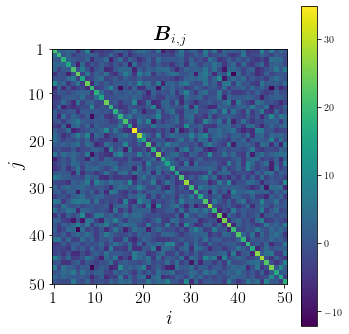

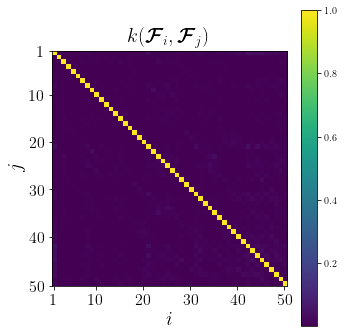

In [54]:
fig, axes = plt.subplots(1, 1, figsize=(5, 5))
im = axes.imshow(ks.W.numpy() @ ks.W.numpy().T)
axes.set_title(r"$\boldsymbol{B}_{i,j}$", size=20)
axes.set_xlabel('$i$', fontsize=20)
axes.set_ylabel('$j$', fontsize=20)
axes.tick_params(axis='x', labelsize=16)
axes.tick_params(axis='y', labelsize=16)
axes.set_xticks((0.,9.,19.,29.,39.,49.))
axes.set_xticklabels((1,10,20,30,40,50))
axes.set_yticks((-.5,9.,19,29,39,49.5))
axes.set_yticklabels((1,10,20,30,40,50))
fig.colorbar(im, ax=axes)
plt.tight_layout()
plt.savefig(''.join(("figures/", toyName, "CorKern.pdf")), bbox_inches='tight')

fig, axes = plt.subplots(1, 1, figsize=(5, 5))
im = axes.imshow(ksf.W.numpy() @ ksf.W.numpy().T)
axes.set_title(r"$k(\boldsymbol{\mathcal{F}}_i, \boldsymbol{\mathcal{F}}_j)$", size=20)
axes.set_xlabel('$i$', fontsize=20)
axes.set_ylabel('$j$', fontsize=20)
axes.tick_params(axis='x', labelsize=16)
axes.tick_params(axis='y', labelsize=16)
axes.set_xticks((0.,9.,19.,29.,39.,49.))
axes.set_xticklabels((1,10,20,30,40,50))
axes.set_yticks((-.5,9.,19,29,39,49.5))
axes.set_yticklabels((1,10,20,30,40,50))
fig.colorbar(im, ax=axes)
plt.tight_layout()
plt.savefig(''.join(("figures/", toyName, "CorKernf.pdf")), bbox_inches='tight')

In [64]:
?gpflow.models.SVGP